# Load

## libs

In [38]:
datadir <- '/n/data1/bwh/medicine/korsunsky/lab/'

In [39]:
suppressWarnings({
    source('../ImageAnalyses/utils_celldive.R')    
})


In [40]:
source('../Figures/colors.R') 


## Colors

In [41]:
## Shared heatmap font sizes
ht_opt(RESET = TRUE)
ht_opt("heatmap_column_names_gp" = gpar(fontsize = 8))
ht_opt("heatmap_row_names_gp" = gpar(fontsize = 8))
ht_opt('legend_title_gp' = gpar(fontsize = 8))
ht_opt('legend_labels_gp' = gpar(fontsize = 8))


## data

In [42]:
lip <- list()
lip$spots <- readRDS(glue('{datadir}/lip1_spots.rds'))
lip$cells <- readRDS(glue('{datadir}/lip1_cells.rds'))
lip$fibroblasts <- readRDS(glue('{datadir}/lip1_fibroblasts.rds'))
lip$stats <- readRDS(glue('{datadir}/lip1_res_coloc.rds'))


gut <- list()
gut$spots <- readRDS(glue('{datadir}/gut_spots.rds'))
gut$cells <- readRDS(glue('{datadir}/gut_cells.rds'))
gut$fibroblasts <- readRDS(glue('{datadir}/gut_fibroblasts.rds'))
gut$stats <- readRDS(glue('{datadir}/gut_res_coloc.rds'))


synovium <- list()
synovium$spots <- readRDS(glue('{datadir}/synovium_spots.rds'))
synovium$cells <- readRDS(glue('{datadir}/synovium_cells.rds'))
synovium$fibroblasts <- readRDS(glue('{datadir}/synovium_fibroblasts.rds'))
synovium$stats <- readRDS(glue('{datadir}/synovium_res_coloc.rds'))


In [43]:
objs <- list(Gut = gut, Lip = lip, Synovium = synovium)

In [71]:
dict_donors <- c('GI6645'='Gut1', 'GI6717'='Gut2', 'GI6846'='Gut3', 'JPR118'='Synovium1', 'JPR125'='Synovium2', 'SG250'='Lip1', 'S445250'='Lip1')


# Niches (Heatmap)

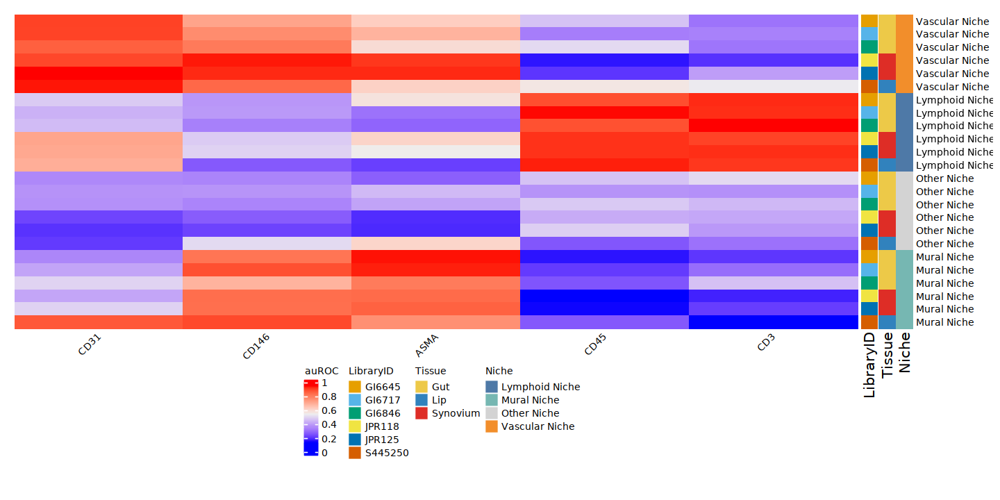

In [45]:
features_plot <- c('CD3', 'CD45', 'CD31', 'CD146', 'ASMA')

## Get marker stats on niches
spots <- cbind(
    objs %>% map('spots') %>% map('metadata') %>% map(dplyr::select, SpotID, LibraryID, Niche_nice) %>% bind_rows(.id = 'Tissue'),
    objs %>% map('spots') %>% map('intensity_norm') %>% map(as.matrix) %>% map(log1p) %>% map(data.frame) %>% map(dplyr::select, all_of(features_plot)) %>% bind_rows()
)

markers <- data.table(spots)[, wilcoxauc(t(dplyr::select(.SD, all_of(features_plot))), .SD$Niche_nice), by = .(LibraryID, Tissue)]

X <- markers %>% 
    dplyr::select(LibraryID, Tissue, feature, Niche = group, auc) %>% 
    dplyr::mutate(Niche = case_when(
        Niche == 'Vascular_ASMA' ~ 'Mural',
        TRUE ~ Niche
    )) %>% 
    dplyr::mutate(Niche = paste0(Niche, ' Niche')) %>% 
    tidyr::spread(feature, auc)
X_mat <- as.matrix(dplyr::select(X, all_of(features_plot)))
rownames(X_mat) <- X$Niche


row_o <- order(factor(rownames(X_mat), levels = paste0(c('Vascular', 'Vascular_ASMA', 'Lymphoid', 'Other'), ' Niche')))
col_o <- c('CD31', 'CD146', 'ASMA', 'CD45', 'CD3')

p2 <- Heatmap(
    matrix = X_mat[row_o, col_o], 
    right_annotation = rowAnnotation(
        df = dplyr::select(X, LibraryID, Tissue, Niche)[row_o, ],
        col = palette_heatmap
    ),
    
    # palette_global[c('Gut', 'Synovium', 'Lip')]
    name = 'auROC', 
    column_names_rot = 45,
    cluster_rows = FALSE, cluster_columns = FALSE,
    # heatmap_legend_param = list(
    #     legend_direction = "horizontal",
    #     title_position = 'lefttop',
    #     legend_height = unit(2, "cm")
    # ),
)    
p2 <- grid.grabExpr(draw(p2, padding = unit(c(10, 2, 2, 2), "mm"), heatmap_legend_side = 'bottom')) #bottom, left, top, right paddings
p2 <- wrap_elements(p2)
fig.size(6, 12)
p2


# Cell types (heatmap)

All cell types, with fibroblasts called out. 


Joining, by = "CellID"


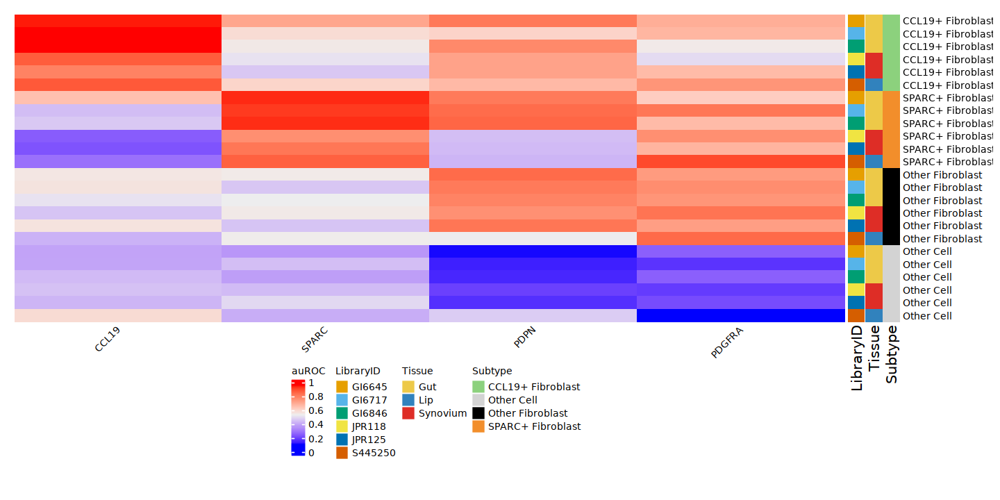

In [48]:
cells <- list(
    Lip = cbind(lip$cells$metadata, log1p(lip$cells$intensity_norm)),
    Synovium = cbind(synovium$cells$metadata, log1p(synovium$cells$intensity_norm)),
    Gut = cbind(gut$cells$metadata, log1p(gut$cells$intensity_norm))
) %>% bind_rows(.id = 'Tissue')

## Attach and harmonize cell types 
fibroblasts <- list(
    Lip = lip$fibroblasts$metadata, 
    Synovium = synovium$fibroblasts$metadata, 
    Gut = gut$fibroblasts$metadata
) %>% bind_rows(.id = 'Tissue')

cells <- cells %>% 
    left_join(dplyr::select(fibroblasts, CellID, Subtype)) %>% 
    dplyr::mutate(Subtype = case_when(
        Subtype == 'Immuno' ~ 'CCL19+ Fibroblast',
        Subtype == 'Vascular' ~ 'SPARC+ Fibroblast',
        Subtype == 'Fibroblast' ~ 'Other Fibroblast', 
        TRUE ~ 'Other Cell'
    )) 


## Get marker stats on these types 
markers <- data.table(cells)[, wilcoxauc(t(dplyr::select(.SD, ASMA:VIM)), .SD$Subtype), by = .(LibraryID, Tissue)]
X <- markers %>% 
    dplyr::select(LibraryID, Tissue, feature, Subtype = group, auc) %>% 
    tidyr::spread(feature, auc)

X_mat <- as.matrix(dplyr::select(X, ASMA:VIM))
rownames(X_mat) <- X$Subtype


row_o <- order(factor(rownames(X_mat), levels = c('CCL19+ Fibroblast', 'SPARC+ Fibroblast','Other Fibroblast', 'Other Cell')))
col_o <- c('CCL19', 'SPARC', 'PDPN', 'PDGFRA')

fig.size(6, 12)
p3 <- Heatmap(
    matrix = X_mat[row_o, col_o], 
    right_annotation = rowAnnotation(
        df = dplyr::select(X, LibraryID, Tissue, Subtype)[row_o, ],
        col = palette_heatmap
    ),
    name = 'auROC', 
    column_names_rot = 45,
    cluster_rows = FALSE, cluster_columns = FALSE
)
    

p3 <- grid.grabExpr(draw(p3, padding = unit(c(10, 2, 2, 2), "mm"), heatmap_legend_side = 'bottom')) #bottom, left, top, right paddings

p3 <- wrap_elements(p3)
# p3 <- wrap_elements(full = p3)
fig.size(6, 12)
p3



# Niches (UMAP)

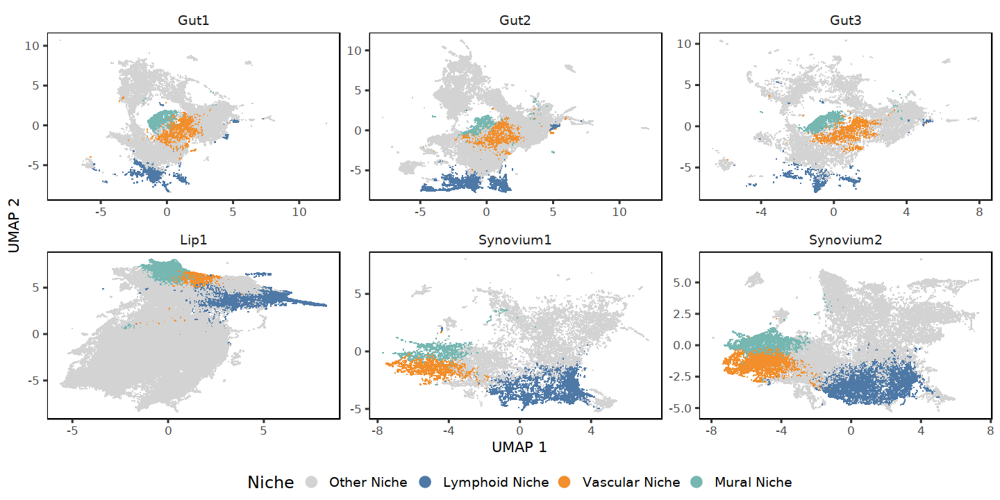

In [75]:
U <- objs %>% map('spots') %>% map('U1') %>% map('embedding') %>% map(data.frame) %>% bind_rows()
M <- objs %>% map('spots') %>% map('metadata') %>% bind_rows(.id = 'Tissue') %>% 
    dplyr::mutate(Niche_nice = case_when(
        Niche_nice == 'Vascular_ASMA' ~ 'Mural',
        TRUE ~ Niche_nice
    )) %>% 
    dplyr::mutate(Niche_nice = paste0(Niche_nice, ' Niche'))
M$LibraryID <- dict_donors[M$LibraryID]

fig.size(6, 12)
p7 <- do_scatter(U, M, 'Niche_nice', do_labels = FALSE, no_guides = FALSE, palette_use = palette_global[unique(M$Niche_nice)]) + facet_wrap(~LibraryID, scales = 'free', nrow=2) + 
    theme(
        legend.position = 'bottom',
        legend.margin = margin(c(0, 0, 0, 0))
    ) + 
    labs(color = 'Niche', fill = 'Niche')

p7

# Cells (UMAP)

Joining, by = "CellID"


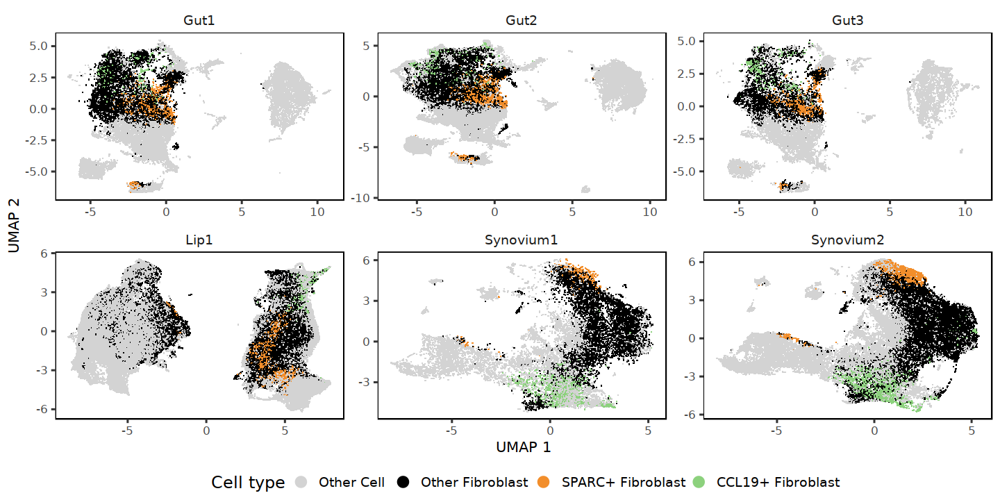

In [76]:
U <- objs %>% map('cells') %>% map('U1') %>% map('embedding') %>% map(data.frame) %>% bind_rows()
M <- objs %>% map('cells') %>% map('metadata') %>% bind_rows(.id = 'Tissue')
M_fibro <- objs %>% map('fibroblasts') %>% map('metadata') %>% map(dplyr::select, CellID, Subtype) %>% bind_rows()
M <- M %>% 
    left_join(M_fibro) %>%     
    dplyr::mutate(Subtype = case_when(
        Subtype == 'Immuno' ~ 'CCL19+ Fibroblast',
        Subtype == 'Vascular' ~ 'SPARC+ Fibroblast',
        Subtype == 'Fibroblast' ~ 'Other Fibroblast', 
        TRUE ~ 'Other Cell'
    )) 
M$LibraryID <- dict_donors[M$LibraryID]


fig.size(6, 12)
p8 <- do_scatter(U, M, 'Subtype', do_labels = FALSE, no_guides = FALSE, palette_use = palette_global[unique(M$Subtype)]) + facet_wrap(~LibraryID, scales = 'free', nrow=2) + 
    theme(
        legend.position = 'bottom',
        legend.margin = margin(c(0, 0, 0, 0))
    ) + 
    labs(color = 'Cell type', fill = 'Cell type')
p8


# Lung IHC

In [52]:
library(magick)

## Immuno

### Rep1

In [53]:
foo <- function(fname) {
    img <- image_read(fname)
    # print(dim(image_data(img)))
    img <- img %>% 
        image_crop("1300x950+0") %>% 
        image_border("white", "10x0") %>% 
        image_ggplot() %>% 
        identity()
    img <- img + 
        geom_segment(x = 30, xend = 190, y = 20, yend = 20, size=1) + 
        geom_text(x = 160, y = 80, label = '40um', size = 4)
    return(img)
}

In [54]:
roi_pos_immuno_rep1 <- glue('../../data/images/lung_ihc_immuno/pos{1:3}.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)

roi_neg_immuno_rep1 <- glue('../../data/images/lung_ihc_immuno/neg{1:3}.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)



In [55]:
fname <- '../../data/images/lung_ihc_immuno/Panel 1 Repeat 2 Scene 2.png'
img_immuno_rep1 <- magick::image_read(fname)
dim(image_data(img_immuno_rep1))
img_immuno_rep1 <- img_immuno_rep1 %>% 
    image_crop("1080x450+220+270") %>% ## crop out width:100px and height:150px starting +50px from the left
    image_fill("white", "+1079+449") %>% #: flood fill with blue starting at the point at x:100, y:200
    image_rotate(90) %>% 
    image_ggplot() + 
    geom_segment(x = 30, xend = 110, y = 20, yend = 20, size=1) + 
    geom_text(x = 140, y = 60, label = '1mm', size = 4) + 
    labs(
        caption = "<span style='color:brown'>PDPN/PDGFRA</span>
                   <span style='color:red'>CD3</span>
                   <span style='color:blue'>STAT1</span>
    ") + 
    theme(plot.caption = ggtext::element_markdown(fill = 'white', size = 14)) + 
    NULL


# fig.size(6, 6)
# img_immuno_rep1

[1]    4 1513  987

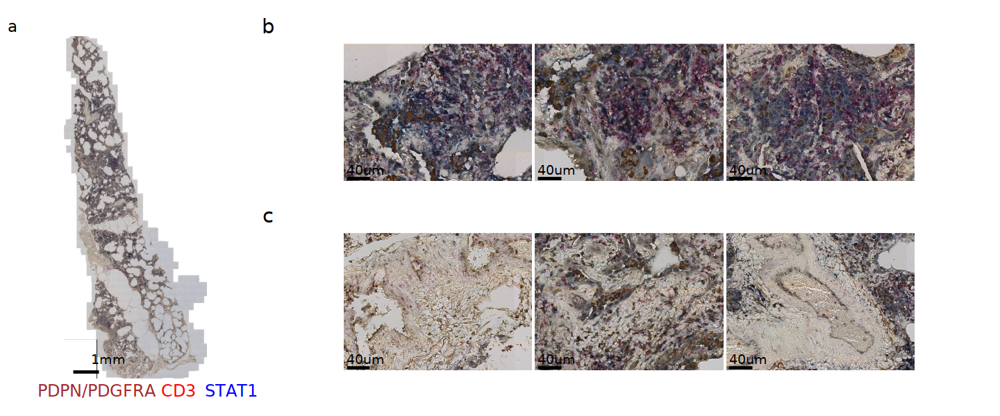

In [56]:
fig.size(5, 12)
(
    img_immuno_rep1 | (wrap_elements(roi_pos_immuno_rep1) / wrap_elements(roi_neg_immuno_rep1))
) + 
    plot_layout(widths = c(1, 3)) + 
    plot_annotation(tag_levels = 'a')


### Rep 2


In [57]:
foo <- function(fname) {
    img <- image_read(fname)
    # print(dim(image_data(img)))
    img <- img %>% 
        image_crop("1300x950+0") %>% 
        image_border("white", "10x0") %>% 
        image_ggplot() %>% 
        identity()
    img <- img + 
        geom_segment(x = 30, xend = 190, y = 20, yend = 20, size=1) + 
        geom_text(x = 160, y = 80, label = '40um', size = 4)
    return(img)
}

In [58]:
roi_pos_immuno_rep2 <- glue('../../data/images/lung_ihc_immuno/Lung_immuno_R1S2_ROI{1:3}pos.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)

roi_neg_immuno_rep2 <- glue('../../data/images/lung_ihc_immuno/Lung_immuno_R1S2_ROI{1:3}neg.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)



[1]    4 1438  809

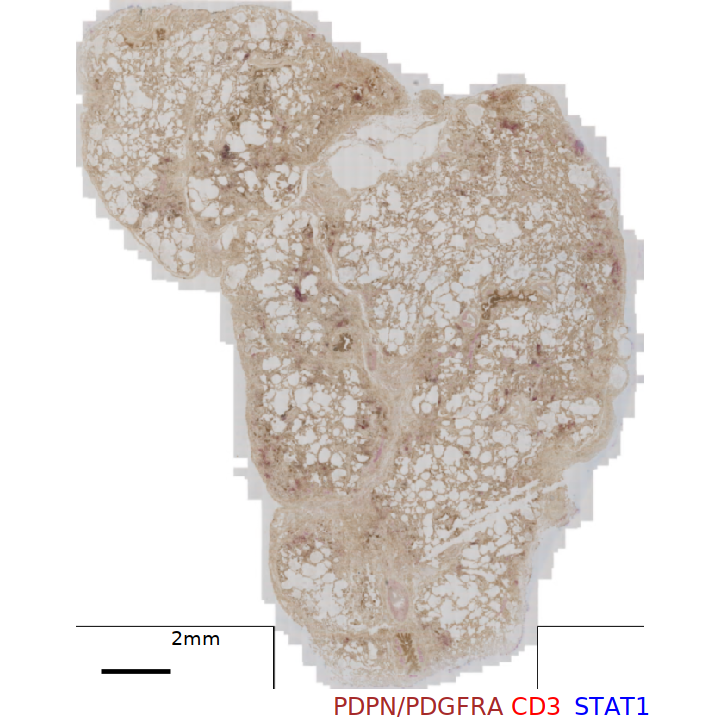

In [59]:
fname <- '../../data/images/lung_ihc_immuno/Lung_immuno_R1S2_neg.png'
img_immuno_rep2 <- magick::image_read(fname)
dim(image_data(img_immuno_rep2))
img_immuno_rep2 <- img_immuno_rep2 %>% 
    image_crop("660x800+390+0") %>% ## crop out width:100px and height:150px starting +50px from the left
    image_fill("white", "+0+799") %>% #: flood fill with blue starting at the point at x:100, y:200
    image_fill("white", "+659+799") %>% #: flood fill with blue starting at the point at x:100, y:200
    # image_rotate(90) %>% 
    image_ggplot() + 
    geom_segment(x = 30, xend = 110, y = 20, yend = 20, size=1) + 
    geom_text(x = 140, y = 60, label = '2mm', size = 4) + 
    labs(
        caption = "<span style='color:brown'>PDPN/PDGFRA</span>
                   <span style='color:red'>CD3</span>
                   <span style='color:blue'>STAT1</span>
    ") + 
    theme(plot.caption = ggtext::element_markdown(fill = 'white', size = 14)) + 
    NULL


fig.size(6, 6)
img_immuno_rep2

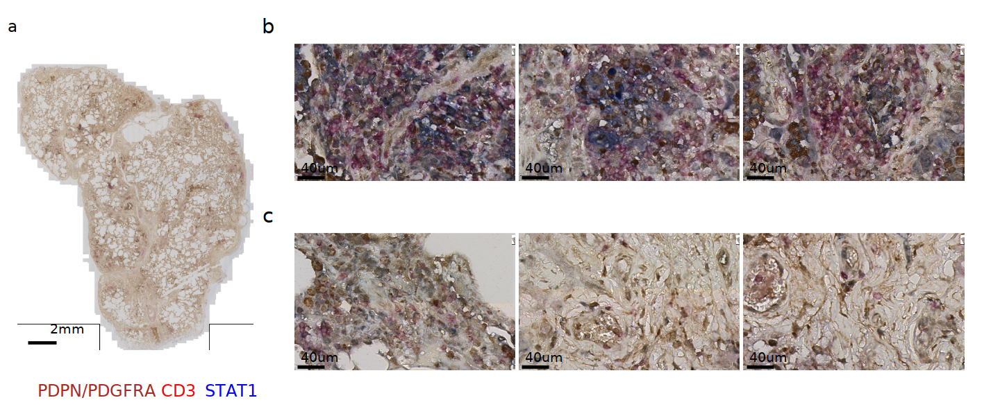

In [60]:
fig.size(5, 12)
(
    img_immuno_rep2 | (wrap_elements(roi_pos_immuno_rep2) / wrap_elements(roi_neg_immuno_rep2))
) + 
    plot_layout(widths = c(1, 3)) + 
    plot_annotation(tag_levels = 'a')


## Vascular

### Rep1

In [61]:
foo <- function(fname) {
    img <- image_read(fname)
    print(dim(image_data(img)))
    img <- img %>% 
        image_crop("1250x809+0") %>% 
        image_border("white", "10x0") %>% 
        image_ggplot() %>% 
        identity()
    img <- img + 
        geom_segment(x = 30, xend = 190, y = 20, yend = 20, size=1) + 
        geom_text(x = 180, y = 80, label = '40um', size = 4)
    return(img)
}

In [62]:
roi_pos_vascular_rep1 <- glue('../../data/images/lung_ihc_vascular/Lung_vascular_pos_{1:3}.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)

roi_neg_vascular_rep1 <- glue('../../data/images/lung_ihc_vascular/Lung_vascular_neg_{1:3}.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)



[1]    4 1438  809
[1]    4 1438  809
[1]    4 1438  809
[1]    4 1438  809
[1]    4 1438  809
[1]    4 1438  809


[1]   3 500 575

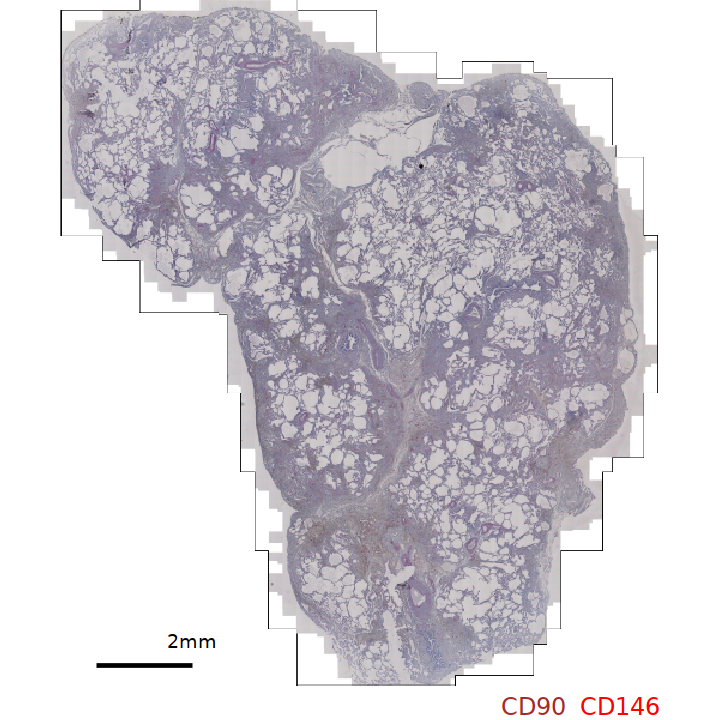

In [63]:
fname <- '../../data/images/lung_ihc_vascular/Panel 2iii Lung repeat 1.czi - Scene #2.png'
img_vascular_rep1 <- magick::image_read(fname) %>% 
    image_scale('500') %>% 
    identity()

dim(image_data(img_vascular_rep1))
img_vascular_rep1 <- img_vascular_rep1 %>% 
    # image_crop("1080x450+220+270") %>% ## crop out width:100px and height:150px starting +50px from the left
    image_fill("white", "+499+574") %>% #: flood fill with blue starting at the point at x:100, y:200
    image_fill("white", "+0+0") %>% #: flood fill with blue starting at the point at x:100, y:200
    # image_rotate(90) %>% 
    image_ggplot() + 
    geom_segment(x = 30, xend = 110, y = 20, yend = 20, size=1) + 
    geom_text(x = 110, y = 40, label = '2mm', size = 4) + 
    labs(
        caption = "<span style='color:brown'>CD90</span>
                   <span style='color:red'>CD146</span>
    ") + 
    theme(plot.caption = ggtext::element_markdown(fill = 'white', size = 14)) + 
    NULL


fig.size(6, 6)
img_vascular_rep1

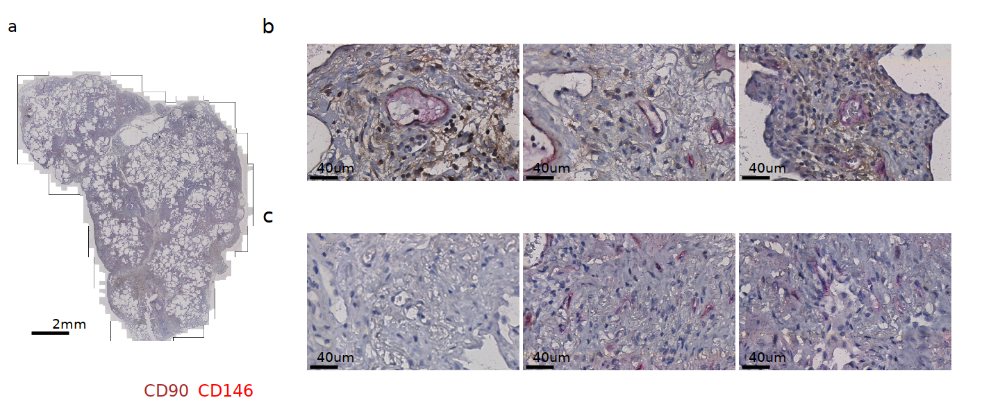

In [64]:
fig.size(5, 12)
(
    img_vascular_rep1 | (wrap_elements(roi_pos_vascular_rep1) / wrap_elements(roi_neg_vascular_rep1))
) + 
    plot_layout(widths = c(1, 3)) + 
    plot_annotation(tag_levels = 'a')


### Rep 2

In [65]:
foo <- function(fname) {
    img <- image_read(fname)
    print(dim(image_data(img)))
    img <- img %>% 
        image_crop("1300x987+0") %>% 
        image_border("white", "10x0") %>% 
        image_ggplot() %>% 
        identity()
    img <- img + 
        geom_segment(x = 30, xend = 190, y = 20, yend = 20, size=1) + 
        geom_text(x = 180, y = 80, label = '40um', size = 4)
    return(img)
}

In [66]:
roi_pos_vascular_rep2 <- glue('../../data/images/lung_ihc_vascular/ROI1_pos{1:3}.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)

roi_neg_vascular_rep2 <- glue('../../data/images/lung_ihc_vascular/ROI1_neg{1:3}.png') %>% 
    map(foo) %>% 
    purrr::reduce(`|`)



[1]    4 1513  987
[1]    4 1513  987
[1]    4 1513  987
[1]    4 1513  987
[1]    4 1513  987
[1]    4 1513  987


[1]    4 1513  987

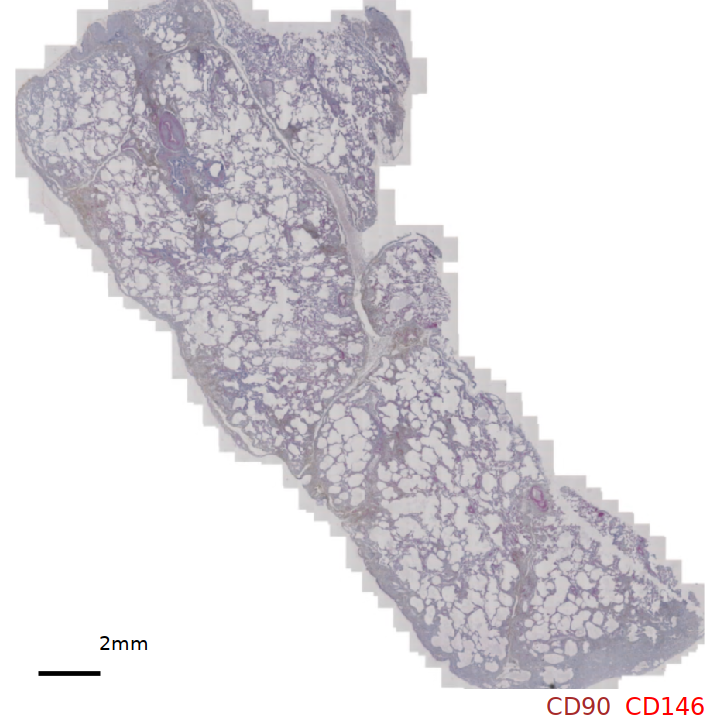

In [67]:
fname <- '../../data/images/lung_ihc_vascular/Panel 2iii repeat1Scene1.png'
img_vascular_rep2 <- magick::image_read(fname) %>% 
    # image_scale('500') %>% 
    identity()

dim(image_data(img_vascular_rep2))
img_vascular_rep2 <- img_vascular_rep2 %>% 
    image_crop("890x890+320+50") %>% ## crop out width:100px and height:150px starting +50px from the left
    image_fill("white", "+889+889") %>% #: flood fill with blue starting at the point at x:100, y:200
    image_fill("white", "+0+0") %>% #: flood fill with blue starting at the point at x:100, y:200
    # image_rotate(90) %>% 
    image_ggplot() + 
    geom_segment(x = 30, xend = 110, y = 20, yend = 20, size=1) + 
    geom_text(x = 140, y = 60, label = '2mm', size = 4) + 
    labs(
        caption = "<span style='color:brown'>CD90</span>
                   <span style='color:red'>CD146</span>
    ") + 
    theme(plot.caption = ggtext::element_markdown(fill = 'white', size = 14)) + 
    NULL


fig.size(6, 6)
img_vascular_rep2

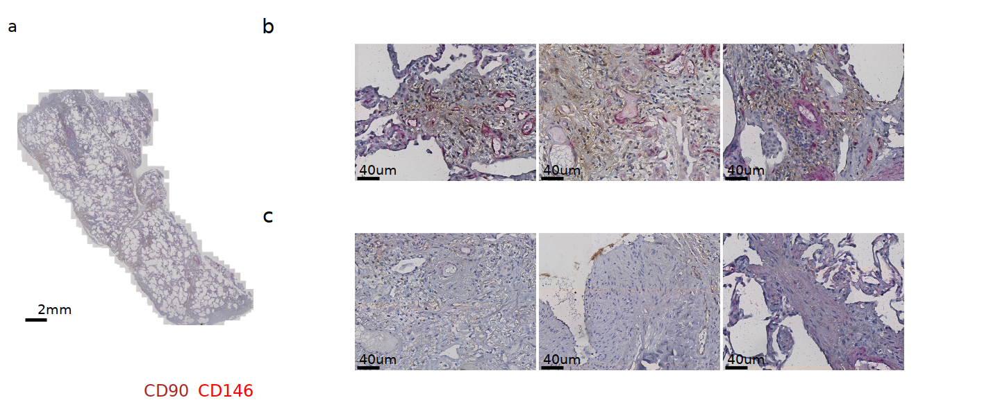

In [68]:
fig.size(5, 12)
(
    img_vascular_rep2 | (wrap_elements(roi_pos_vascular_rep2) / wrap_elements(roi_neg_vascular_rep2))
) + 
    plot_layout(widths = c(1, 3)) + 
    plot_annotation(tag_levels = 'a')


# Full 

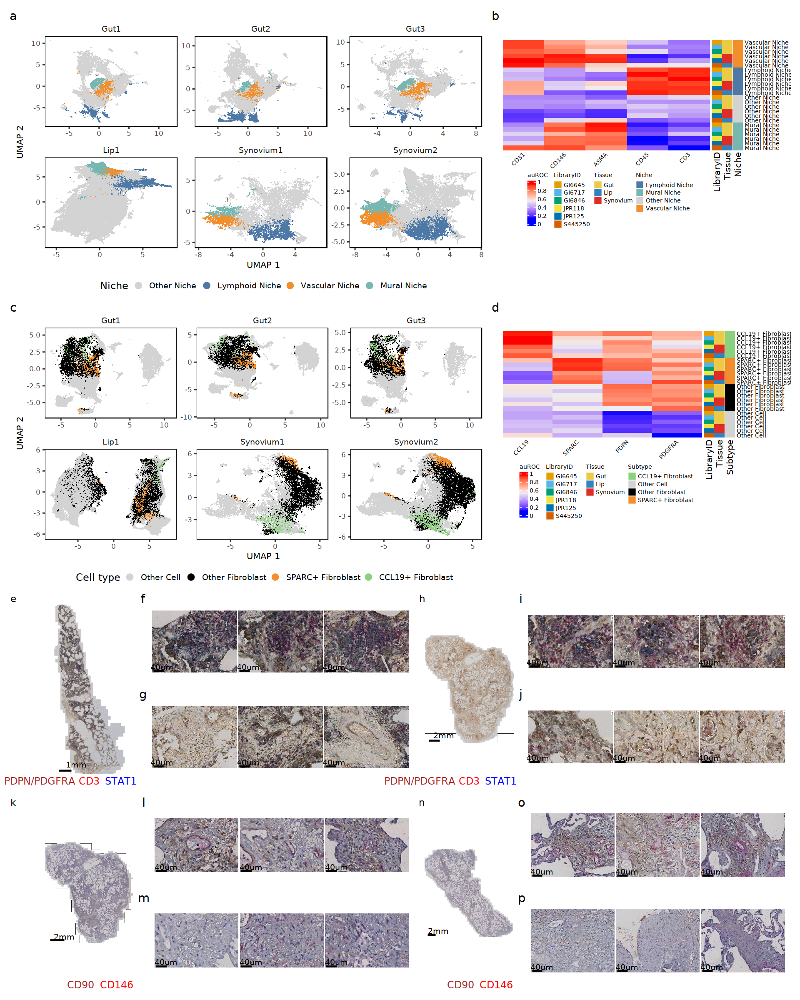

In [77]:
fig.size(20, 16)
fig <- (
    (
        (p7 | p2) + plot_layout(widths = c(1.5, 1))
    ) / 
    (
        (p8 | p3) + plot_layout(widths = c(1.5, 1))
    ) / 
    (
        (
            img_immuno_rep1 | (wrap_elements(roi_pos_immuno_rep1) / wrap_elements(roi_neg_immuno_rep1)) | 
            img_immuno_rep2 | (wrap_elements(roi_pos_immuno_rep2) / wrap_elements(roi_neg_immuno_rep2))
        ) + 
        plot_layout(widths = c(1, 3, 1, 3))    
    ) / 
    (
        (
            img_vascular_rep1 | (wrap_elements(roi_pos_vascular_rep1) / wrap_elements(roi_neg_vascular_rep1)) | 
            img_vascular_rep2 | (wrap_elements(roi_pos_vascular_rep2) / wrap_elements(roi_neg_vascular_rep2))
        ) + 
        plot_layout(widths = c(1, 3, 1, 3))    
    )    
) + 
    plot_layout(heights = c(1, 1, .8, .8)) + 
    plot_annotation(tag_levels = 'a')

fig


In [78]:
ggsave(
    filename = '../../manuscript/figures/SuppFigure6.pdf', 
    plot = fig,
    units = 'in', device = 'pdf', 
    height = 20, width = 16,
    useDingbats = FALSE
)

ggsave(
    filename = '../../manuscript/figures/SuppFigure6.png', 
    plot = fig,
    units = 'in', device = 'png', 
    height = 20, width = 16
)
